#### Submited by Manjit Ullal

### 1. What is the data type of each feature? (ordinal/nominal/interval/ratio, discrete/continuous)

There are 10 features, 9 are numeric and 1 is categorical.

categorical

    ordinal: ocean_proximity

numeric (continuous)

    ratio: median_income, median_house_value, housing_median_age
    interval: longitude, latitude

numeric (discrete)

    ratio: total_rooms, total_bedrooms, households, population

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import KBinsDiscretizer

In [2]:
data_dir = "C:\\Users\\Manjit\\Desktop\\Masters\\1.USML\\homework\\"
data = pd.read_csv(data_dir+'housing.csv')

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
longitude             20640 non-null float64
latitude              20640 non-null float64
housing_median_age    20640 non-null float64
total_rooms           20640 non-null float64
total_bedrooms        20433 non-null float64
population            20640 non-null float64
households            20640 non-null float64
median_income         20640 non-null float64
median_house_value    20640 non-null float64
ocean_proximity       20640 non-null object
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [4]:
data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


### 2. Display summary statistics of the data. What can you learn from it on the data?

Answer:

There is lot of variation from mean in total_rooms, total_bedrooms, population, households and median_house_value. 
This due to lot of positive outliers in these columns, we can observe this in figure 1.


In [5]:
data.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [6]:
fig = make_subplots(rows=3, cols=3)

fig.add_trace(go.Box(y=data.longitude, name="longitude"),row=1, col=1)
fig.add_trace(go.Box(y=data.latitude, name="latitude"), row=1, col=2)
fig.add_trace(go.Box(y=data.housing_median_age, name="housing_median_age"), row=1, col=3)
fig.add_trace(go.Box(y=data.total_rooms, name="total_rooms"), row=2, col=1)
fig.add_trace(go.Box(y=data.total_bedrooms, name="total_bedrooms"), row=2, col=2)
fig.add_trace(go.Box(y=data.population, name="population"), row=2, col=3)
fig.add_trace(go.Box(y=data.households, name="households"), row=3, col=1)
fig.add_trace(go.Box(y=data.median_income, name="median_income"), row=3, col=2)
fig.add_trace(go.Box(y=data.median_house_value, name="median_house_value"), row=3, col=3)


fig.update_layout(height=900, title = "figure 1: Boxplot of all features")
fig.show()


### 3. Compute the correlation between each feature and the target median_house_value. Which features have strong correlation with the target?

Answer:

median_income is most correlated with target median_house_value

In [7]:
# calculate the correlation matrix

corr = data.iloc[:,0:-1].corr()

In [8]:
import plotly.figure_factory as ff

figure = ff.create_annotated_heatmap(
    z=corr.values,
    x=list(corr.columns),
    y=list(corr.index),
    annotation_text=corr.round(2).values,
    showscale=True)
figure.update_layout(title = "figure 2: correlation between all columns")
figure.show()

In [9]:
# below 4 features are very closely correlated

data[['total_rooms','total_bedrooms','population','households']].corr()

,total_rooms,total_bedrooms,population,households
total_rooms,1.000000,0.930380,0.857126,0.918484
total_bedrooms,0.930380,1.000000,0.877747,0.979728
population,0.857126,0.877747,1.000000,0.907222
households,0.918484,0.979728,0.907222,1.000000


### 4. Use data visualization tools to explore the data set. Display at least three different types of graphs.

Answer:

Visualtions are already incorporated throughout the notebook

Text(0.5, 0.98, 'figure 3: histogram of all features')

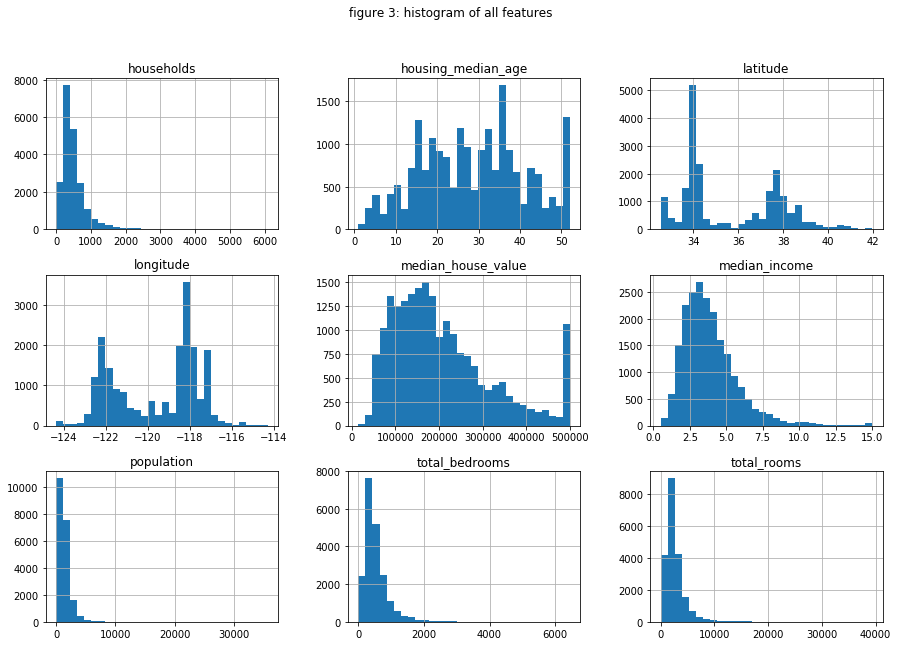

In [10]:
data.hist(bins=30, figsize=(15, 10))
import matplotlib.pyplot as plt
plt.suptitle("figure 3: histogram of all features")

In [11]:
# we can see that the median value increases as the ocean proximity increases 

fig = px.histogram(data, x="median_house_value", color="ocean_proximity")
fig.update_layout(title = "figure 4: relation between ocean proximity and median house value")
fig.show()

In [12]:
# we see that lot of houses in the dataset is near ocean

fig = px.histogram(data, x="ocean_proximity")
fig.update_layout(title = "figure 5: count of types of houses")
fig.show()

In [13]:
import plotly.express as px
fig = px.scatter(x= data.longitude, y= data.latitude, color=data.ocean_proximity)
fig.update_layout(title = "figure 6: Location of the House")
fig.show()

In [14]:
import plotly.express as px
fig = px.scatter(x= data.longitude, y= data.latitude, color=data.median_house_value)
fig.update_layout(title = "figure 7: Price of House based on location")
fig.show()

### 5. What type of problems can you detect in the data set? Name at least three different problems.

1. population, total_bedrooms, households and total_rooms are correlated . So we do not need all the 4 features together. We can select 1 feature out of 4 or different combination which can be checked during feature engineering.


2. population, total_bedrooms, households and total_rooms have many outliers. So the distribution is left skewed.


3. ocean_proximity is categorical value which needs to convert to numeric. From figure 7 we see that as the closeness to ocean increases the house value also increases which indicates that this categorical values needs to be ordinal.


4. latitude and the longitude can be converted to bins.


5. Data has 207 missing values.



In [33]:
#all the missing values in the same column
data.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

### 6. Clean the data set using the data preprocessing techniques discussed in class. Show a sample of the data set before and after the cleaning.

Answer:

Missing data in the total_bedrooms columns is imputed with the mean

In [37]:
from sklearn.impute import SimpleImputer

imp = SimpleImputer(missing_values=np.nan, strategy='mean')
data_modified = imp.fit_transform(data.iloc[:,0:9])
data_modified = pd.DataFrame(data_modified)
data_modified['ocean_proximity'] = data.ocean_proximity
data_modified.columns = data.columns

In [71]:
# no more missing values 

data_modified.isna().sum()

0    0
1    0
2    0
3    0
4    0
5    0
6    0
7    0
8    0
dtype: int64

### 7. Extract at least two new features from the data set that have strong correlation with the target feature.

techniques applied.

1. convert oceans_proximity to one hot encoding, this enabled to use the categorical feature and the feature is well correlated with target.

2. convert latitude and longitude into bins of 5.

3. create additional feauture hxm = households * median_income. This is well correlated compared to households alone.

4. perform log transform on hxm, this further improves the correlation.

In [114]:
""" turn ocean proximity into one hot encoding """

data_modifiedc = pd.get_dummies(data_modified, columns=['ocean_proximity'], drop_first=True)
data_modifiedc[['median_house_value', 'ocean_proximity_INLAND', 'ocean_proximity_ISLAND',
                'ocean_proximity_NEAR BAY', 'ocean_proximity_NEAR OCEAN']].corr()

,median_house_value,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
median_house_value,1.000000,-0.484859,0.023416,0.160284,0.141862
ocean_proximity_INLAND,-0.484859,1.000000,-0.010614,-0.240887,-0.262163
ocean_proximity_ISLAND,0.023416,-0.010614,1.000000,-0.005499,-0.005985
ocean_proximity_NEAR BAY,0.160284,-0.240887,-0.005499,1.000000,-0.135818
ocean_proximity_NEAR OCEAN,0.141862,-0.262163,-0.005985,-0.135818,1.000000


In [115]:
""" using ordinal encoding, feature created using this technique is not useful because the correlation is not strong 
between target and data this could be due the encoder assigning incorrect values for example high value get low number"""

labelencoder = LabelEncoder()
data_modifiedl = data_modified.copy()
data_modifiedl['ocean_proximity'] = labelencoder.fit_transform(data_modifiedl['ocean_proximity'])
data_modifiedl[['median_house_value','ocean_proximity']].corr()

,median_house_value,ocean_proximity
median_house_value,1.00000,0.08175
ocean_proximity,0.08175,1.00000


In [116]:
data_modifiedc['hxm'] = data_modifiedc.households*data_modifiedc.median_income
data_modifiedc['hxm'] = data_modifiedc['hxm'].apply(lambda x:np.log(x))
data_modifiedc[['median_house_value','hxm','households','median_income']].corr()

,median_house_value,hxm,households,median_income
median_house_value,1.000000,0.402608,0.065843,0.688075
hxm,0.402608,1.000000,0.688322,0.496344
households,0.065843,0.688322,1.000000,0.013033
median_income,0.688075,0.496344,0.013033,1.000000


In [117]:
"""final processed data """

data_modifiedc.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN,hxm
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0,0,1,0,6.955569
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0,0,1,0,9.153452
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,0,1,0,7.158171
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0,0,1,0,7.119505
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0,0,1,0,6.903914
